# Data Loading and Pre-Processing

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/RiceLeafs'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_095031.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_095029.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_095429.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_100501.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_100511.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_100616.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_095439.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_095523.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_100547.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_100544.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_100509.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_100605.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IMG_20190419_100539.jpg
/content/drive/MyDrive/RiceLeafs/train/LeafBlast/IM

In [ ]:
import os
import random
import zipfile
import tensorflow as tf
from keras.layers import Input, Lambda, Dense, Flatten,GlobalAveragePooling2D,BatchNormalization,Dropout,Activation
from keras.models import Model
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, log_loss, accuracy_score
from sklearn.model_selection import train_test_split

In [ ]:
source_path = '/content/drive/MyDrive/RiceLeafs'

# train source
source_path_train_Brownspot = os.path.join(source_path, 'train/BrownSpot')
source_path_train_Healthy   = os.path.join(source_path, 'train/Healthy')
source_path_train_Hispa     = os.path.join(source_path, 'train/Hispa')
source_path_train_LeafBlast = os.path.join(source_path, 'train/LeafBlast')

print(f"There are {len(os.listdir(source_path_train_Brownspot))} images of Train Brown Spot.")
print(f"There are {len(os.listdir(source_path_train_Healthy))} images of Train Healthy.")
print(f"There are {len(os.listdir(source_path_train_Hispa))} images of Train Hispa.")
print(f"There are {len(os.listdir(source_path_train_LeafBlast))} images of Train LeafBlast.\n")

# Validation source
source_path_validation_Brownspot  = os.path.join(source_path, 'validation/BrownSpot')
source_path_validation_Healthy    = os.path.join(source_path, 'validation/Healthy')
source_path_validation_Hispa      = os.path.join(source_path, 'validation/Hispa')
source_path_validation_LeafBlast  = os.path.join(source_path, 'validation/LeafBlast')

print(f"There are {len(os.listdir(source_path_validation_Brownspot))} images of Validation Brown Spot.")
print(f"There are {len(os.listdir(source_path_validation_Healthy))} images of Validation Healthy.")
print(f"There are {len(os.listdir(source_path_validation_Hispa))} images of Validation Hispa.")
print(f"There are {len(os.listdir(source_path_validation_LeafBlast))} images of Validation LeafBlast.\n")

Sample Testing Healthy Rice Leaf:


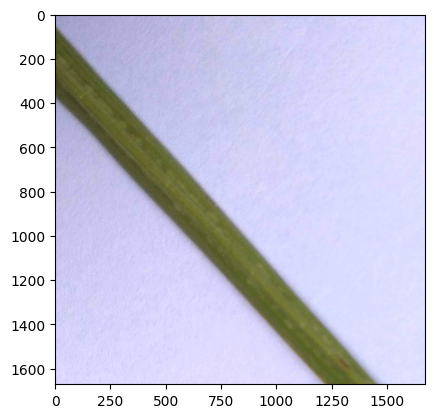

Sample Testing Leaf Blast Rice Leaf:


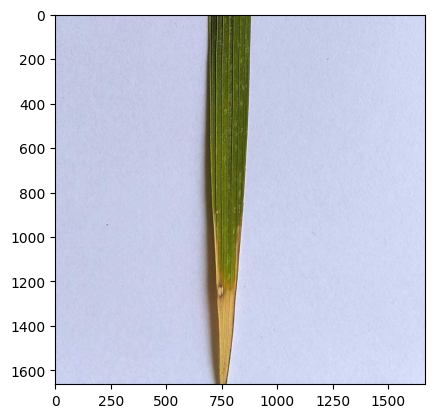

Sample Testing Brownspot Rice Leaf:


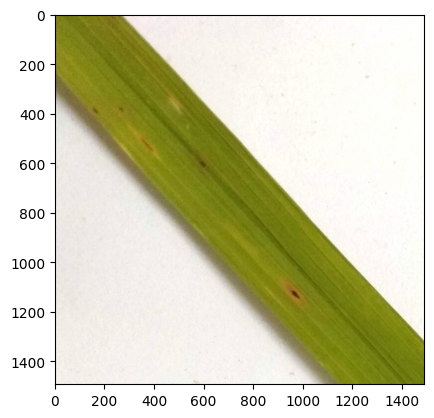

Sample Testing Hispa Rice Leaf:


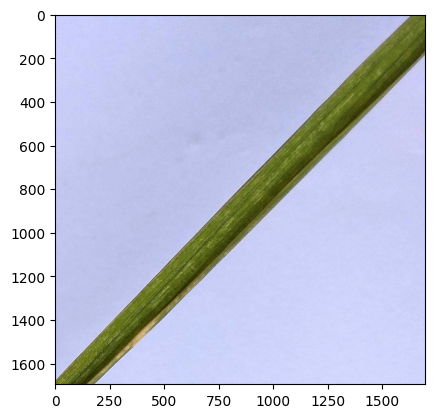

In [ ]:
random_number = random.randint(0, 10)
print("Sample Testing Healthy Rice Leaf:")
plt.imshow(load_img(f"{os.path.join(source_path_train_Healthy, os.listdir(source_path_train_Healthy)[random_number])}"))
plt.show()

print("Sample Testing Leaf Blast Rice Leaf:")
plt.imshow(load_img(f"{os.path.join(source_path_train_LeafBlast , os.listdir(source_path_train_LeafBlast )[random_number])}"))
plt.show()

print("Sample Testing Brownspot Rice Leaf:")
plt.imshow(load_img(f"{os.path.join(source_path_train_Brownspot , os.listdir(source_path_train_Brownspot )[random_number])}"))
plt.show()

print("Sample Testing Hispa Rice Leaf:")
plt.imshow(load_img(f"{os.path.join(source_path_train_Hispa , os.listdir(source_path_train_Hispa)[random_number])}"))
plt.show()

In [ ]:
TRAINING_DIR = os.path.join(source_path, 'train')
VALIDATION_DIR = os.path.join(source_path, 'validation')

In [ ]:
dataset = []
shape = (224, 224)
count = 0
for file in os.listdir(TRAINING_DIR):
  path = os.path.join(TRAINING_DIR, file)
  time = 0
  for k in os.listdir(path):
    image   = load_img(os.path.join(path, k), grayscale=False, color_mode='rgb', target_size = shape)
    image   = img_to_array(image)
    image   = image/255.0
    dataset += [[image, count]]
    time    +=1
  count = count+1

In [ ]:
testset=[]
count=0
for file in os.listdir(VALIDATION_DIR):
    path=os.path.join(VALIDATION_DIR,file)
    t=0
    for im in os.listdir(path):
        image    = load_img(os.path.join(path,im), grayscale=False, color_mode='rgb', target_size=shape)
        image    = img_to_array(image)
        image    = image/255.0
        testset  += [[image,count]]
        t        += 1
    count        = count+1

In [ ]:
data,trainlabels = zip(*dataset)
test,testlabels = zip(*testset)

labels1 = to_categorical(trainlabels)
labels  = np.array(labels1)

data    = np.array(data)
test    = np.array(test)

trainx, testx, trainy, testy = train_test_split(data,
                                                labels,
                                                test_size=0.2,
                                                random_state=42)


In [ ]:
print(trainx.shape)
print(testx.shape)
print(trainy.shape)
print(testy.shape)

(1119, 224, 224, 3)
(280, 224, 224, 3)
(1119, 4)
(280, 4)


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(horizontal_flip=True,
                             vertical_flip=True,
                             rotation_range=30,
                             zoom_range=0.2,
                             width_shift_range=0.1,
                             height_shift_range=0.2,
                             shear_range=0.2)

# MODEL1 ResNet


In [ ]:
import numpy as np
import pickle
import cv2
from os import listdir
from sklearn.preprocessing import LabelBinarizer
from keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation, Flatten, Dropout, Dense
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.preprocessing import image
from tensorflow.keras.utils import img_to_array
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [ ]:
default_image_size = tuple((256, 256))
image_size = 0
directory_root = '/content/drive/MyDrive/RiceLeafs'
width=256
height=256
depth=3

In [ ]:
def convert_image_to_array(image_dir):
    try:
        image = cv2.imread(image_dir)
        if image is not None :
            image = cv2.resize(image, default_image_size)
            return img_to_array(image)
        else :
            return np.array([])
    except Exception as e:
        print(f"Error : {e}")
        return None

In [ ]:
image_list, label_list = [], []
try:
    print("[INFO] Loading images ...")
    root_dir = listdir(directory_root)
    for directory in root_dir :
        # remove .DS_Store from list
        if directory == ".DS_Store" :
            root_dir.remove(directory)

    for plant_folder in root_dir :
        plant_disease_folder_list = listdir(f"{directory_root}/{plant_folder}")

        for disease_folder in plant_disease_folder_list :
            # remove .DS_Store from list
            if disease_folder == ".DS_Store" :
                plant_disease_folder_list.remove(disease_folder)

        for plant_disease_folder in plant_disease_folder_list:
            print(f"[INFO] Processing {plant_disease_folder} ...")
            plant_disease_image_list = listdir(f"{directory_root}/{plant_folder}/{plant_disease_folder}/")

            for single_plant_disease_image in plant_disease_image_list :
                if single_plant_disease_image == ".DS_Store" :
                    plant_disease_image_list.remove(single_plant_disease_image)

            for image in plant_disease_image_list[:200]:
                image_directory = f"{directory_root}/{plant_folder}/{plant_disease_folder}/{image}"
                if image_directory.endswith(".jpg") == True or image_directory.endswith(".JPG") == True:
                    image_list.append(convert_image_to_array(image_directory))
                    label_list.append(plant_disease_folder)
    print("[INFO] Image loading completed")
except Exception as e:
    print(f"Error : {e}")

[INFO] Loading images ...
[INFO] Processing LeafBlast ...
[INFO] Processing BrownSpot ...
[INFO] Processing Healthy ...
[INFO] Processing Hispa ...
[INFO] Processing train ...
[INFO] Processing validation ...
[INFO] Processing Healthy ...
[INFO] Processing Hispa ...
[INFO] Processing LeafBlast ...
[INFO] Processing BrownSpot ...
[INFO] Image loading completed


In [ ]:
image_size = len(image_list)
image_size

1230

In [ ]:
label_binarizer = LabelBinarizer()
image_labels = label_binarizer.fit_transform(label_list)
pickle.dump(label_binarizer,open('label_transform.pkl', 'wb'))
n_classes = len(label_binarizer.classes_)

In [ ]:
print(label_binarizer.classes_)

['BrownSpot' 'Healthy' 'Hispa' 'LeafBlast']


In [ ]:
np_image_list = np.array(image_list, dtype=np.float16) / 225.0

In [ ]:
print("[INFO] Spliting data to train, test")
x_train, x_test, y_train, y_test = train_test_split(np_image_list, image_labels, test_size=0.2, random_state = 42)


[INFO] Spliting data to train, test


In [ ]:
aug = ImageDataGenerator(
    rotation_range=25, width_shift_range=0.1,
    height_shift_range=0.1, shear_range=0.2,
    zoom_range=0.2,horizontal_flip=True,
    fill_mode="nearest")

In [ ]:
model = Sequential()
inputShape = (height, width, depth)
chanDim = -1

if K.image_data_format() == "channels_first":
  inputShape = (depth, height, width)
  chanDim = 1

model.add(Conv2D(32, (3, 3), padding="same",input_shape=inputShape))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(3, 3)))
model.add(Dropout(0.4))

model.add(Conv2D(64, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(Conv2D(64, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

model.add(Conv2D(128, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(Conv2D(128, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(BatchNormalization(axis=chanDim))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.6))

model.add(Flatten())
model.add(Dense(1024))
model.add(Activation("relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))

model.add(Dense(n_classes))
model.add(Activation("softmax"))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 activation (Activation)     (None, 256, 256, 32)      0         
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 85, 85, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 85, 85, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 85, 85, 64)        1

In [ ]:
from keras import layers
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import layer_utils, to_categorical
from keras.callbacks import Callback,EarlyStopping,ModelCheckpoint,ReduceLROnPlateau
from keras.applications.imagenet_utils import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import plot_model
from keras.initializers import glorot_uniform

In [ ]:
def identity_block(X, f, filters, stage, block):
    """
    Arguments:
    X -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    f -- integer, specifying the shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    stage -- integer, used to name the layers, depending on their position in the network
    block -- string/character, used to name the layers, depending on their position in the network

    Returns:
    X -- output of the identity block, tensor of shape (n_H, n_W, n_C)
    """

    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    # Retrieve Filters
    F1, F2, F3 = filters

    # Save the input value. You'll need this later to add back to the main path.
    X_shortcut = X

    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    # Second component of main path
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation
    X = Add()([X,X_shortcut])
    X = Activation('relu')(X)

    return X

In [ ]:
def convolutional_block(X, f, filters, stage, block, s = 2):
    """
    Arguments:
    X -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    f -- integer, specifying the shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    stage -- integer, used to name the layers, depending on their position in the network
    block -- string/character, used to name the layers, depending on their position in the network
    s -- Integer, specifying the stride to be used

    Returns:
    X -- output of the convolutional block, tensor of shape (n_H, n_W, n_C)
    """

    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    # Retrieve Filters
    F1, F2, F3 = filters

    # Save the input value
    X_shortcut = X


    ##### MAIN PATH #####
    # First component of main path
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a',padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    # Second component of main path
    X = Conv2D(F2, (f, f), strides = (1,1), name = conv_name_base + '2b', padding = 'same', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path
    X = Conv2D(F3, (1, 1), strides = (1,1), name = conv_name_base + '2c', padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    ##### SHORTCUT PATH ####
    X_shortcut = Conv2D(F3, (1, 1), strides = (s,s), name = conv_name_base + '1', padding = 'valid', kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation
    X = Add()([X,X_shortcut])
    X = Activation('relu')(X)

    return X

In [ ]:
def ResNet50(inputShape = (256, 256, 3), n_classes = 1):
    """
    Implementation of the popular ResNet50 the following architecture:
    CONV2D -> BATCHNORM -> RELU -> MAXPOOL -> CONVBLOCK -> IDBLOCK*2 -> CONVBLOCK -> IDBLOCK*3
    -> CONVBLOCK -> IDBLOCK*5 -> CONVBLOCK -> IDBLOCK*2 -> AVGPOOL -> TOPLAYER

    Arguments:
    input_shape -- shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """

    # Define the input as a tensor with shape input_shape
    X_input = Input(inputShape)


    # Zero-Padding
    X = ZeroPadding2D((3, 3))(X_input)

    # Stage 1
    X = Conv2D(32, (7, 7), strides = (1, 1), name = 'conv1', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3))(X)

    # Stage 2
    X = convolutional_block(X, f = 3, filters = [32, 32, 128], stage = 2, block='a', s = 1)
    X = identity_block(X, 3, [32, 32, 128], stage=2, block='b')
    X = identity_block(X, 3, [32, 32, 128], stage=2, block='c')

    # Stage 3
    X = convolutional_block(X, f = 3, filters = [64, 64, 256], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [64, 64, 256], stage=3, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=3, block='c')
    X = identity_block(X, 3, [64, 64, 256], stage=3, block='d')

    # Stage 4
    X = convolutional_block(X, f = 3, filters = [128, 128, 512], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='d')
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='e')
    X = identity_block(X, 3, [128, 128, 512], stage=4, block='f')

    # Stage 5
    X = convolutional_block(X, f = 3, filters = [256,256, 1024], stage = 5, block='a', s = 2)
    X = identity_block(X, 3, [256,256, 1024], stage=5, block='b')
    X = identity_block(X, 3, [256,256, 1024], stage=5, block='c')

    # AVGPOOL
    X = AveragePooling2D(pool_size=(2,2), name='avg_pool')(X)


    # output layer
    X = Flatten()(X)
    X = Dense(n_classes, activation='softmax')(X)


    # Create model
    model = Model(inputs = X_input, outputs = X, name='ResNet50')

    return model

#model.add(Flatten()) model.add(Dense(1024)) model.add(Activation("relu")) model.add(BatchNormalization()) model.add(Dropout(0.2))

#model.add(Dense(n_classes)) model.add(Activation("softmax"))

In [ ]:
model = ResNet50(inputShape = (256,256,3), n_classes = 4)

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', patience=25),
             ModelCheckpoint(filepath='best_model.h5', monitor='val_loss', save_best_only=True),
            ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, verbose=2, mode='max')]

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "ResNet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 256, 256, 32  4736        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                           

In [ ]:
EPOCHS = 50
INIT_LR = 1e-3
BS = 8

opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)

# distribution
model.compile(loss="binary_crossentropy", optimizer=opt,metrics=["accuracy"])
# train the network
print("[INFO] training network...")


[INFO] training network...


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
history = model.fit_generator(
    aug.flow(x_train, y_train, batch_size=BS),
    validation_data=(x_test, y_test),
    steps_per_epoch=len(x_train) // BS,
    epochs=EPOCHS, verbose=1
    )

<ipython-input-31-f5a41846f0f2>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/50
123/123 [==============================] - 42s 202ms/step - loss: 1.6803 - accuracy: 0.3140 - val_loss: 0.6053 - val_accuracy: 0.2764
Epoch 2/50
123/123 [==============================] - 20s 161ms/step - loss: 0.6464 - accuracy: 0.3841 - val_loss: 0.5592 - val_accuracy: 0.3374
Epoch 3/50
123/123 [==============================] - 19s 154ms/step - loss: 0.5305 - accuracy: 0.3760 - val_loss: 0.5420 - val_accuracy: 0.3699
Epoch 4/50
123/123 [==============================] - 20s 162ms/step - loss: 0.5186 - accuracy: 0.4024 - val_loss: 0.7563 - val_accuracy: 0.2236
Epoch 5/50
123/123 [==============================] - 19s 154ms/step - loss: 0.5056 - accuracy: 0.4329 - val_loss: 0.4805 - val_accuracy: 0.4756
Epoch 6/50
123/123 [==============================] - 20s 158ms/step - loss: 0.4909 - accuracy: 0.4593 - val_loss: 0.8913 - val_accuracy: 0.3659
Epoch 7/50
123/123 [==============================] - 19s 155ms/step - loss: 0.4846 - accuracy: 0.4573 - val_loss: 0.7532 - val_ac

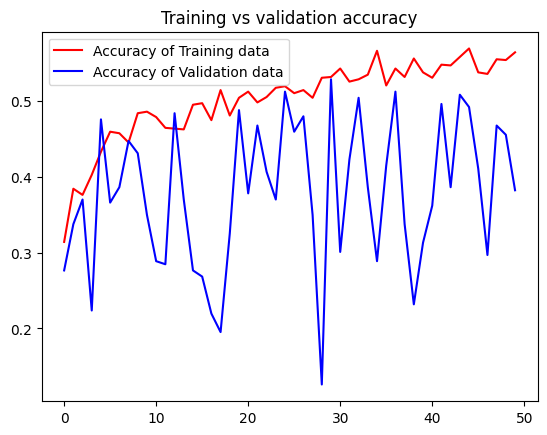

<Figure size 640x480 with 0 Axes>

In [ ]:
get_acc = history.history['accuracy']
value_acc = history.history['val_accuracy']
get_loss = history.history['loss']
validation_loss = history.history['val_loss']

epochs = range(len(get_acc))
plt.plot(epochs, get_acc, 'r', label='Accuracy of Training data')
plt.plot(epochs, value_acc, 'b', label='Accuracy of Validation data')
plt.title('Training vs validation accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

# Model 2 InceptionResNetV2 (Pre-Existing)

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tensorflow.keras.layers import Dropout, Activation, Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input

In [ ]:
training_folder = '/content/drive/MyDrive/RiceLeafs/train'
validation_folder = '/content/drive/MyDrive/RiceLeafs/validation'

In [ ]:
brownspot = [training_folder + '/BrownSpot/' + img for img in os.listdir(training_folder + '/BrownSpot')[:9]]
healthy = [training_folder + '/Healthy/' + img for img in os.listdir(training_folder + '/Healthy')[:9]]
hispa = [training_folder + '/Hispa/' + img for img in os.listdir(training_folder + '/Hispa')[:9]]
leafblast = [training_folder + '/LeafBlast/' + img for img in os.listdir(training_folder + '/LeafBlast')[:9]]

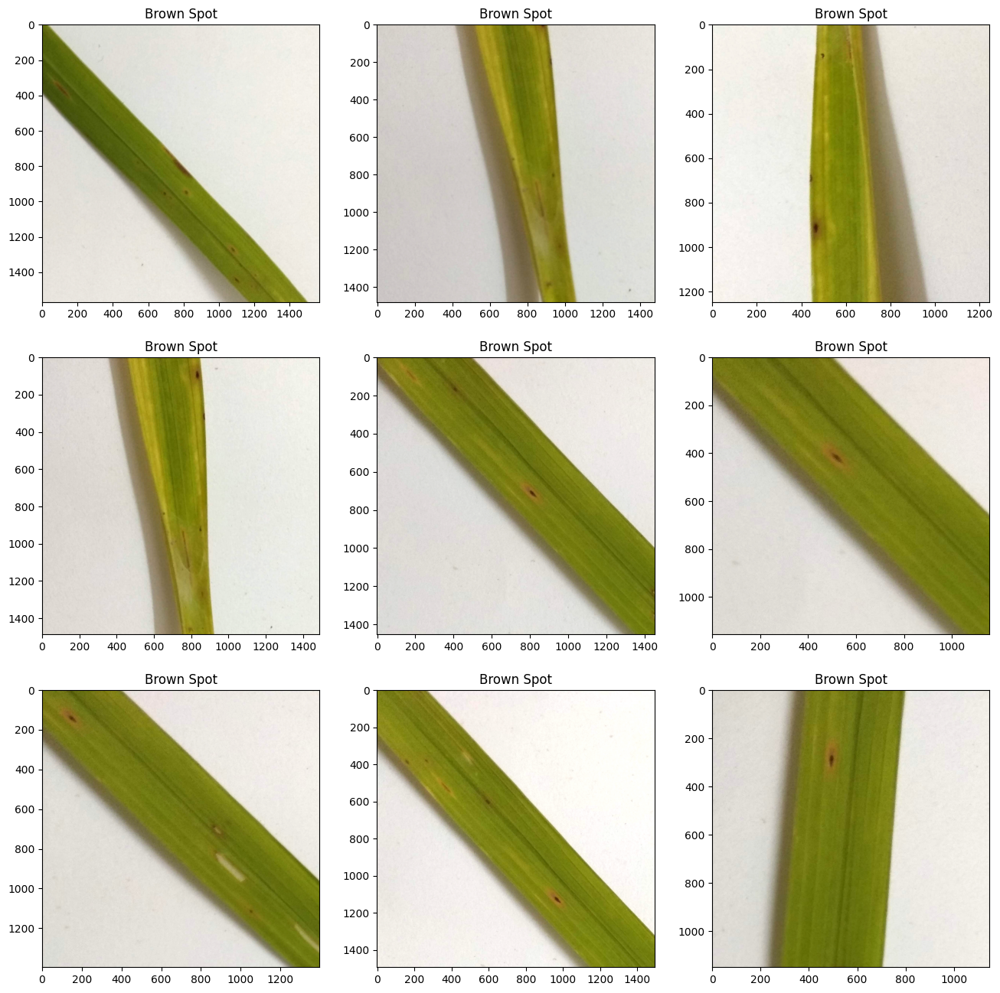

In [ ]:
plt.figure(figsize=(16,16))
for i,k  in enumerate(brownspot):
    image = Image.open(k)
    plt.subplot(3,3,i+1)
    plt.imshow(image)
    plt.title("Brown Spot")

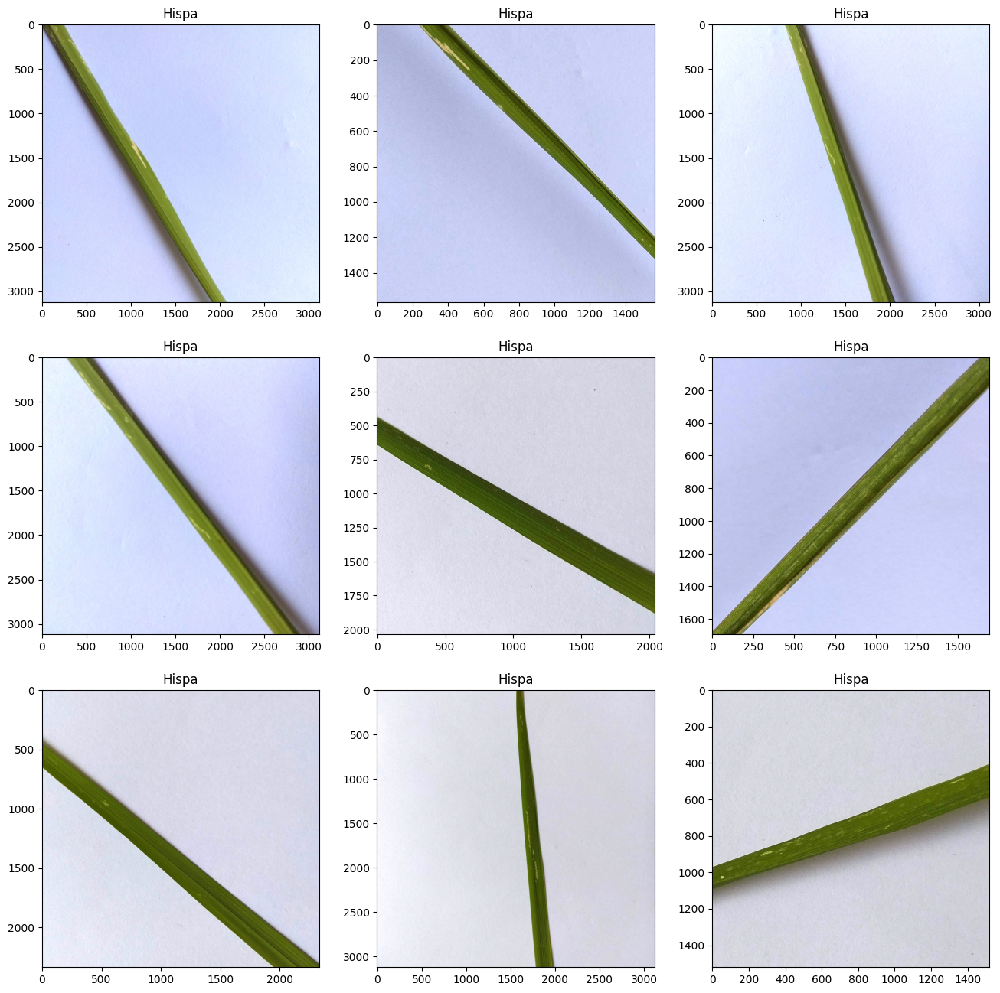

In [ ]:
plt.figure(figsize=(16,16))
for i,k  in enumerate(hispa):
    image = Image.open(k)
    plt.subplot(3,3,i+1)
    plt.imshow(image)
    plt.title("Hispa")

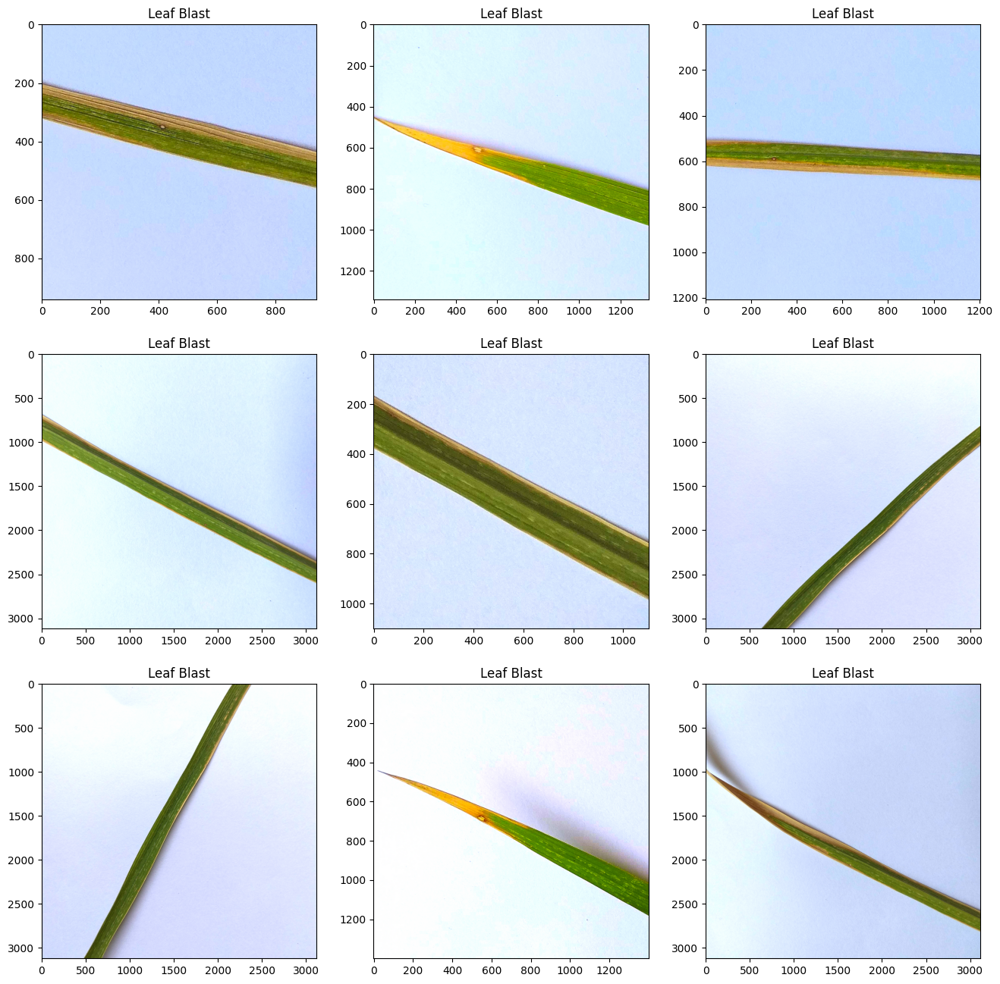

In [ ]:
plt.figure(figsize=(16,16))
for i,k  in enumerate(leafblast):
    image = Image.open(k)
    plt.subplot(3,3,i+1)
    plt.imshow(image)
    plt.title("Leaf Blast")

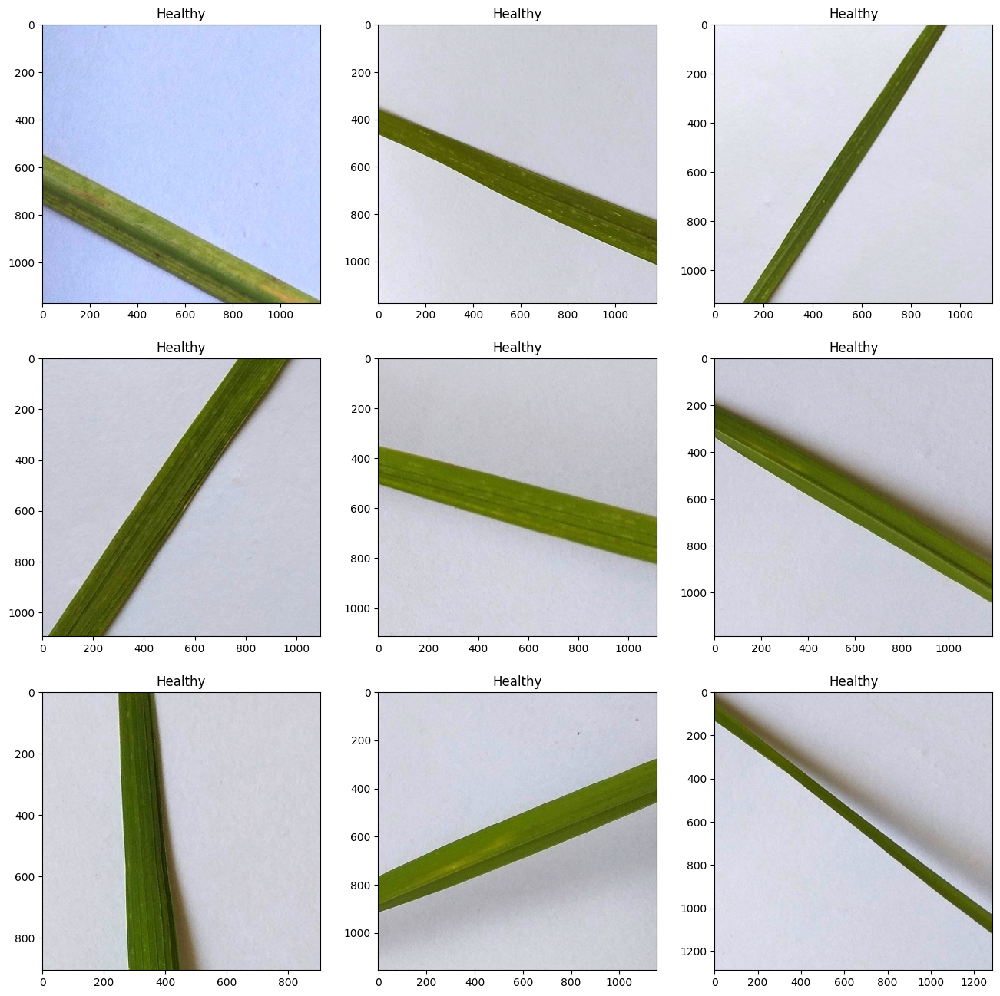

In [ ]:
plt.figure(figsize=(16,16))
for i,k  in enumerate(healthy):
    image = Image.open(k)
    plt.subplot(3,3,i+1)
    plt.imshow(image)
    plt.title("Healthy")

In [ ]:
batch_size = 10
image_size = 300
input_shape = (image_size, image_size, 3)
dropout_rate = 0.3

In [ ]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode = 'nearest',
        channel_shift_range=0.5,
        brightness_range=[0.5,1.2],
        rotation_range=25,
        zoom_range=[0.5, 1],
        )
validation_datagen = ImageDataGenerator(rescale=1./255,
                                        horizontal_flip = True,
                                        vertical_flip = True,
                                        fill_mode = "nearest")

In [ ]:
train_datagenerator = train_datagen.flow_from_directory(
        training_folder,
        target_size=(image_size, image_size),
        shuffle=True,
        batch_size=batch_size,
        class_mode='categorical')
validation_datagenerator = validation_datagen.flow_from_directory(
        validation_folder,
        target_size=(image_size, image_size),
        shuffle=True,
        batch_size=batch_size,
        class_mode='categorical')

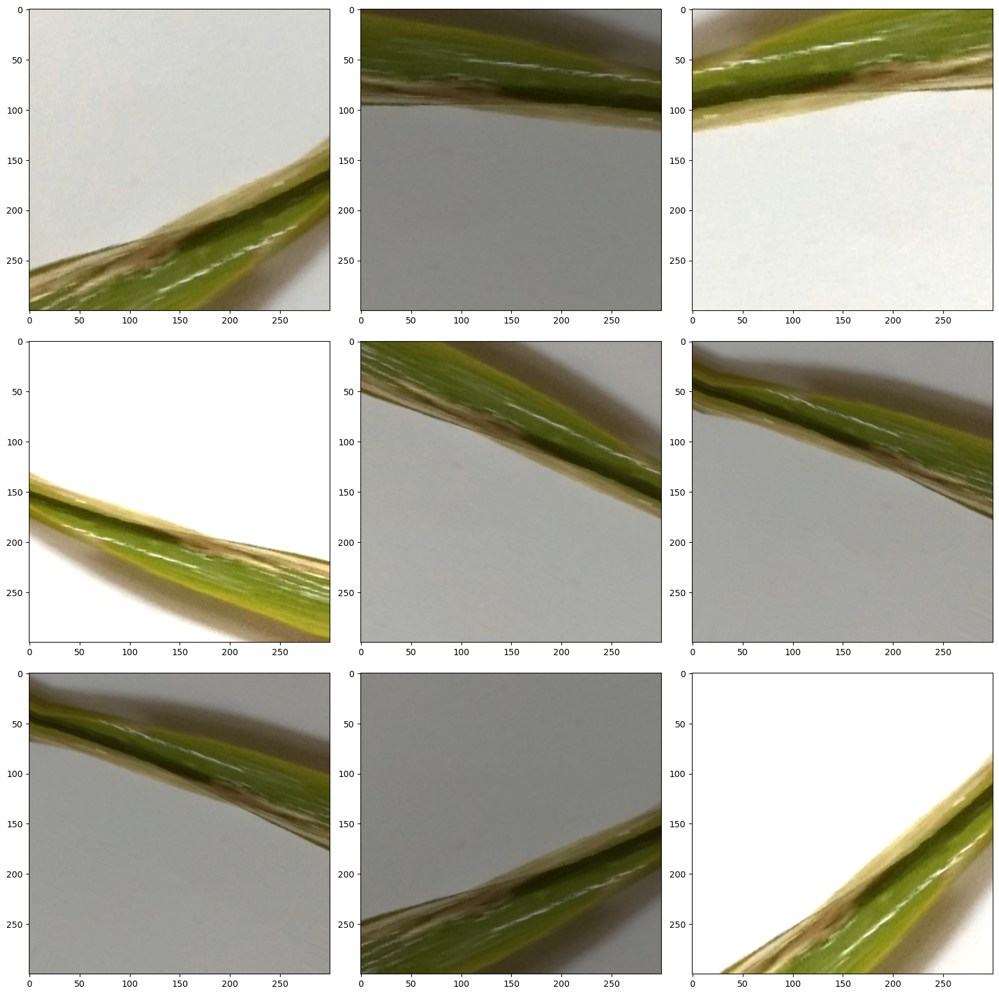

In [ ]:
# This function will plot images in the form of a grid with 3 row and 3 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(3, 3, figsize=(16,16))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

augmented_images = [train_datagenerator[0][0][0] for i in range(9)]
plotImages(augmented_images)

In [ ]:
def create_model():
    resnet= InceptionResNetV2(weights="imagenet",
                                   include_top=False,
                                   input_shape=input_shape,
                                   )


    input_layer = Input(shape = input_shape)
    preprocess = preprocess_input(input_layer)
    efficientnet = resnet(preprocess)
    pooling = GlobalAveragePooling2D()(efficientnet)
    dropout = Dropout(dropout_rate)(pooling)
    outputs = Dense(4, activation="softmax")(dropout)
    model = Model(inputs=input_layer, outputs=outputs)

    return model
model = create_model()
model.summary()

219055592/219055592 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 300, 300, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 300, 300, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 300, 300, 3)      0         
 a)                                                              
                                                                 
 inception_resnet_v2 (Functi  (None, 8, 8, 1536)       54336736  
 onal)                                                           
                                                                 
 global_average_pooling2d (G  (None, 1536)             0    

In [ ]:
epochs = 10
decay_steps = int(np.ceil(train_datagenerator.n / float(batch_size)))*epochs
cosine_decay = tf.compat.v1.train.linear_cosine_decay(learning_rate=0.001,global_step=1000,decay_steps=decay_steps, alpha=0.3)
callbacks = [tf.keras.callbacks.ModelCheckpoint(filepath='best_rice_disease_model.h5', monitor='val_loss', save_best_only=True)]
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(cosine_decay), metrics=["accuracy"])

In [ ]:
# Fitting models to the generators
history = model.fit(
    train_datagenerator,
    steps_per_epoch=int(np.ceil(train_datagenerator.n / float(batch_size))),
    epochs=epochs,
    validation_data=validation_datagenerator,
    validation_steps=int(np.ceil(validation_datagenerator.n / float(batch_size)))
)

Epoch 1/10
85/85 [==============================] - 532s 5s/step - loss: 1.2258 - accuracy: 0.4799 - val_loss: 1.4512 - val_accuracy: 0.1624
Epoch 2/10
85/85 [==============================] - 189s 2s/step - loss: 1.1901 - accuracy: 0.5379 - val_loss: 1.4153 - val_accuracy: 0.1893
Epoch 3/10
85/85 [==============================] - 188s 2s/step - loss: 1.1388 - accuracy: 0.5829 - val_loss: 1.3689 - val_accuracy: 0.2817
Epoch 4/10
85/85 [==============================] - 191s 2s/step - loss: 1.0871 - accuracy: 0.6576 - val_loss: 1.3603 - val_accuracy: 0.2295
Epoch 5/10
85/85 [==============================] - 190s 2s/step - loss: 1.0540 - accuracy: 0.6493 - val_loss: 1.3473 - val_accuracy: 0.2504
Epoch 6/10
85/85 [==============================] - 193s 2s/step - loss: 1.0036 - accuracy: 0.6991 - val_loss: 1.4715 - val_accuracy: 0.2310
Epoch 7/10
85/85 [==============================] - 193s 2s/step - loss: 0.9904 - accuracy: 0.6931 - val_loss: 1.5990 - val_accuracy: 0.2265
Epoch 8/10
85

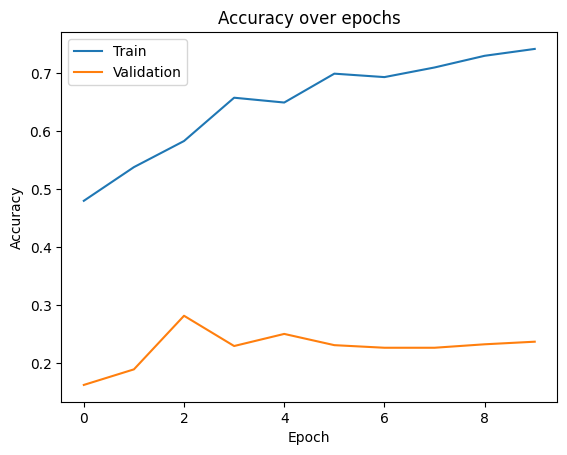

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy over epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()

# Model 3 Custom CNNs, Inceptions

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np # linear algebra
import tensorflow_hub as hub
import os

from tensorflow.keras import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
from keras import optimizers

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

Number of replicas: 1


In [ ]:
print("Version ", tf.__version__)
print("Eager mode:", tf.executing_eagerly())
print("Hub version: ", hub.__version__)
print("GPU is","available" if tf.test.is_gpu_available() else"Not Available")

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


Version  2.12.0
Eager mode: True
Hub version:  0.13.0
GPU is available


In [ ]:
data_dir = os.path.join(os.path.dirname('//content/drive/MyDrive/'), 'RiceLeafs')

In [ ]:
train_dir = os.path.join(data_dir, 'train')
train_BrownSpot_dir = os.path.join(train_dir, 'BrownSpot')
train_Healthy_dir = os.path.join(train_dir, 'Healthy')
train_Hispa_dir = os.path.join(train_dir, 'Hispa')
train_LeafBlast_dir = os.path.join(train_dir, 'LeafBlast')


validation_dir = os.path.join(data_dir, 'validation')
validation_BrownSpot_dir = os.path.join(validation_dir, 'BrownSpot')
validation_Healthy_dir = os.path.join(validation_dir, 'Healthy')
validation_Hispa_dir = os.path.join(validation_dir, 'Hispa')
validation_LeafBlast_dir = os.path.join(validation_dir, 'LeafBlast')

In [ ]:
train_BrownSpot_names = os.listdir(train_BrownSpot_dir)
print(train_BrownSpot_names[:10])

train_Healthy_names =  os.listdir(train_Healthy_dir)
print(train_Healthy_names[:10])

train_Hispa_names = os.listdir(train_Hispa_dir)
print(train_Hispa_names[:10])

train_LeafBlast_names =  os.listdir(train_LeafBlast_dir)
print(train_LeafBlast_names[:10])

['IMG_20190420_193754.jpg', 'IMG_20190420_193749.jpg', 'IMG_20190420_193741.jpg', 'IMG_20190420_193517.jpg', 'IMG_20190420_194202.jpg', 'IMG_20190420_194204.jpg', 'IMG_20190420_194203.jpg', 'IMG_20190420_194159.jpg', 'IMG_20190420_194219.jpg', 'IMG_20190420_194504.jpg']
['IMG_20190419_123642.jpg', 'IMG_20190419_123704.jpg', 'IMG_20190419_123951.jpg', 'IMG_20190419_123646.jpg', 'IMG_20190419_123709.jpg', 'IMG_20190419_124013.jpg', 'IMG_20190419_123623.jpg', 'IMG_20190419_123631.jpg', 'IMG_20190419_123656.jpg', 'IMG_20190419_123701.jpg']
['IMG_20190419_131420.jpg', 'IMG_20190419_131449.jpg', 'IMG_20190419_134302.jpg', 'IMG_20190419_133810.jpg', 'IMG_20190419_131503.jpg', 'IMG_20190419_134304.jpg', 'IMG_20190419_131458.jpg', 'IMG_20190419_131606.jpg', 'IMG_20190419_134503.jpg', 'IMG_20190419_134513.jpg']
['IMG_20190419_095031.jpg', 'IMG_20190419_095029.jpg', 'IMG_20190419_095429.jpg', 'IMG_20190419_100501.jpg', 'IMG_20190419_100511.jpg', 'IMG_20190419_100616.jpg', 'IMG_20190419_095439.jpg

In [ ]:
import time
import os
from os.path import exists

def count(dir, counter=0):
    "returns number of files in dir and subdirs"
    for pack in os.walk(dir):
        for f in pack[2]:
            counter += 1
    return dir + " : " + str(counter) + " files"

print('total images for training :', count(train_dir))
print('total images for validation :', count(validation_dir))

total images for training : //content/drive/MyDrive/RiceLeafs/train : 1399 files
total images for validation : //content/drive/MyDrive/RiceLeafs/validation : 671 files


In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg


# Parameters for our graph; we'll outpu images in a 4x4 configuration
nrows = 4
ncols = 4

# for iternating over images
pic_index = 0

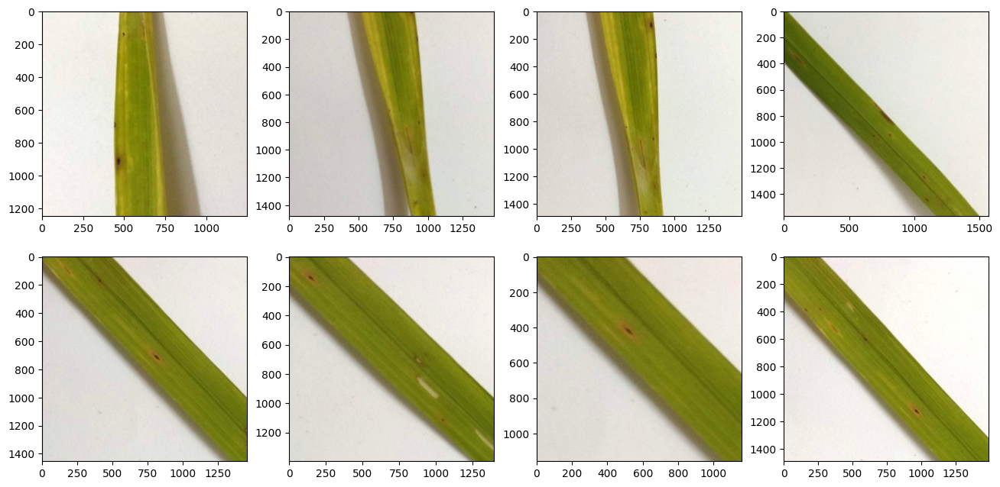

In [ ]:
# Set up matplotlib fig, and size it to fit 4x4 pics

fig = plt.gcf()
fig.set_size_inches(ncols *4, nrows*4)

pic_index += 8
next_BrownSpot_pix = [os.path.join(train_BrownSpot_dir, fname)
                for fname in train_BrownSpot_names[pic_index-8:pic_index]]
for i, img_path in enumerate(next_BrownSpot_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows,ncols,i +1)
  #sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

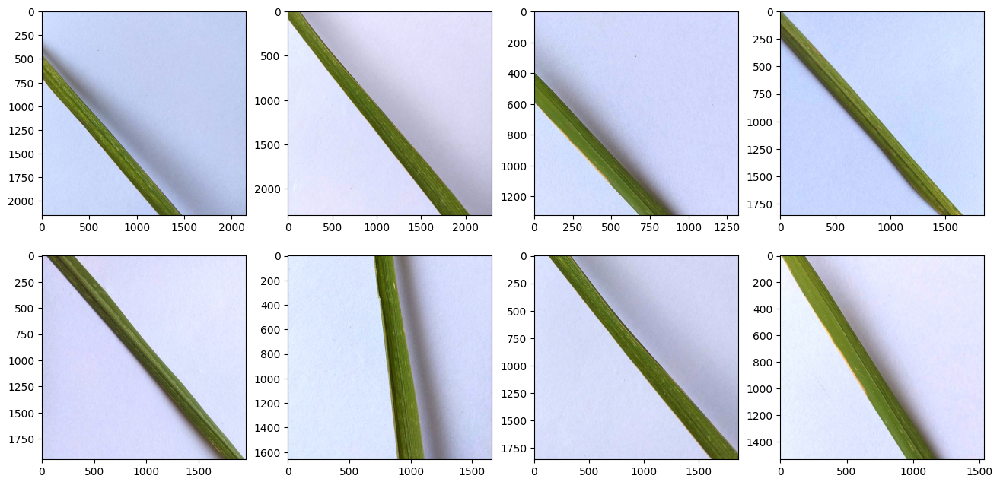

In [ ]:
fig = plt.gcf()
fig.set_size_inches(ncols *4, nrows*4)

pic_index += 8
next_Healthy_pix = [os.path.join(train_Healthy_dir, fname)
                for fname in train_Healthy_names[pic_index-8:pic_index]]


for i, img_path in enumerate(next_Healthy_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows,ncols,i +1)
  #sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

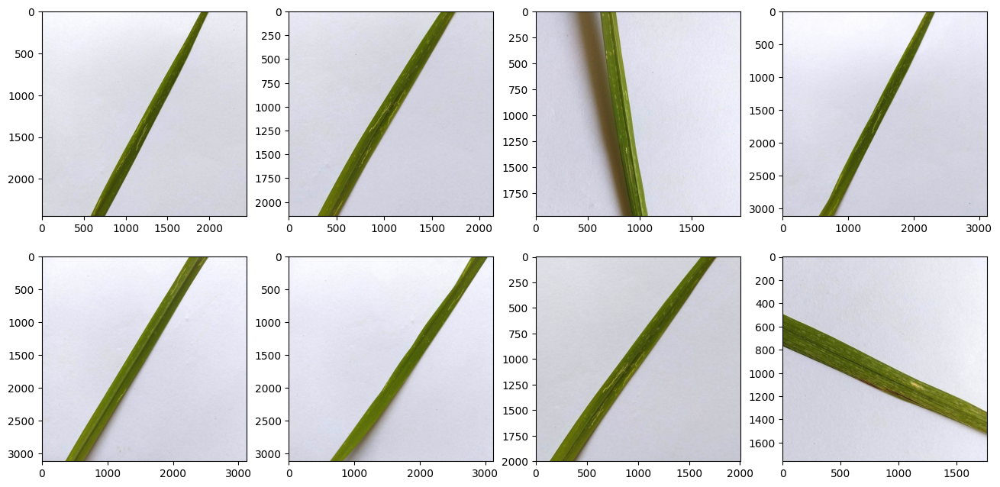

In [ ]:
# Set up matplotlib fig, and size it to fit 4x4 pics

fig = plt.gcf()
fig.set_size_inches(ncols *4, nrows*4)

pic_index += 8

next_Hispa_pix = [os.path.join(train_Hispa_dir, fname)
                for fname in train_Hispa_names[pic_index-8:pic_index]]


for i, img_path in enumerate(next_Hispa_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows,ncols,i +1)
  #sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

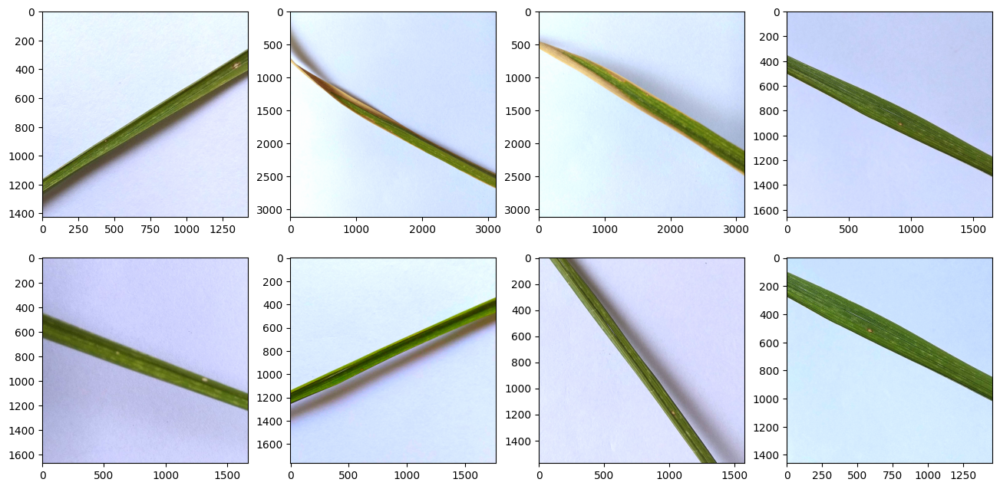

In [ ]:
# Set up matplotlib fig, and size it to fit 4x4 pics

fig = plt.gcf()
fig.set_size_inches(ncols *4, nrows*4)

pic_index += 8

next_LeafBlast_pix = [os.path.join(train_LeafBlast_dir, fname)
                for fname in train_LeafBlast_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_LeafBlast_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows,ncols,i +1)
  #sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [ ]:
IMAGE_SHAPE = (244, 244)
BATCH_SIZE = 64

In [ ]:
# Inputs are suitably resized for the selected module. Dataset augmentation (i.e., random distortions of an image each time it is read) improves training, esp. when fine-tuning.

validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    shuffle=False,
    seed=42,
    color_mode="rgb",
    class_mode="categorical",
    target_size=IMAGE_SHAPE,
    batch_size=BATCH_SIZE)

do_data_augmentation = True
if do_data_augmentation:
  train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
      rescale = 1./255,
      rotation_range=40,
      horizontal_flip=True,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      fill_mode='nearest' )
else:
  train_datagen = validation_datagen

train_generator = train_datagen.flow_from_directory(
    train_dir,
    shuffle=True,
    seed=42,
    color_mode="rgb",
    class_mode="categorical",
    target_size=IMAGE_SHAPE,
    batch_size=BATCH_SIZE)

Found 671 images belonging to 4 classes.
Found 1399 images belonging to 4 classes.


In [ ]:
train_generator.num_classes

4

In [ ]:
class MyCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self,epoch,log = {}):
    if(log.get('accuracy')> 0.99):
      if(log.get('val_accuracy')>0.99):
        print("\n Reached 99% Accuracy for both train and val.")
        self.model.stop_training = True

callbacks = MyCallback()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the input shape and number of classes
input_shape = (224, 224, 3)
num_classes = 4

# Create the model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 26, 26, 128)     

In [ ]:
LEARNING_RATE = 0.001

model.compile(optimizer = tf.keras.optimizers.Adam(),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

In [ ]:
EPOCHS = 10

history = model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples//train_generator.batch_size,
        epochs=EPOCHS,
        validation_data=validation_generator,
        callbacks = [callbacks],
        validation_steps=validation_generator.samples//validation_generator.batch_size)

21/21 [==============================] - 258s 12s/step - loss: 1.1995 - accuracy: 0.4352 - val_loss: 1.5522 - val_accuracy: 0.1953
Epoch 7/10
21/21 [==============================] - 259s 13s/step - loss: 1.1917 - accuracy: 0.4464 - val_loss: 1.6031 - val_accuracy: 0.1953
Epoch 8/10
21/21 [==============================] - 260s 13s/step - loss: 1.1824 - accuracy: 0.4307 - val_loss: 1.5320 - val_accuracy: 0.1953
Epoch 9/10
21/21 [==============================] - 259s 13s/step - loss: 1.1854 - accuracy: 0.4330 - val_loss: 1.6408 - val_accuracy: 0.1953
Epoch 10/10
12/21 [================>.............] - ETA: 1:14 - loss: 1.1939 - accuracy: 0.4282

In [ ]:
import matplotlib.pylab as plt
import numpy as np

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.ylabel("Accuracy (training and validation)")
plt.xlabel("Training Steps")

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.ylabel("Loss (training and validation)")
plt.xlabel("Training Steps")
plt.show()

In [ ]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf.dim_ordering_tf_kernels.notop.h5

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
local_weights_file = '/tmp/inception_v3_weights_tf.dim_ordering_tf_kernels.notop.h5'

pre_trained_model = InceptionV3(
                                input_shape = (244,244,3),
                                include_top= False,
                                weights = None
)

pre_trained_model.load_weights(local_weights_file)

for layer in pre_trained_model.layers:
    layer.trainable = False

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print(f'The shape of the last layer is {last_layer.output_shape}')
output_layer = last_layer.output


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

x = tf.keras.layers.Flatten()(output_layer)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.4)(x)
#x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(4, activation='softmax')(x)

model = Model(pre_trained_model.input, x,name="RiceLeafs_Inception_model")

In [ ]:
LEARNING_RATE = 0.001

model.compile(optimizer = tf.keras.optimizers.RMSprop(lr = LEARNING_RATE),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

In [ ]:
EPOCHS = 10

history = model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples//train_generator.batch_size,
        epochs=EPOCHS,
        validation_data=validation_generator,
        callbacks = [callbacks],
        validation_steps=validation_generator.samples//validation_generator.batch_size)


<ipython-input-59-c448d8c23513>:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/10
21/21 [==============================] - 276s 13s/step - loss: 16.7891 - accuracy: 0.3663 - val_loss: 2.8863 - val_accuracy: 0.1984
Epoch 2/10
21/21 [==============================] - 259s 13s/step - loss: 1.4011 - accuracy: 0.4195 - val_loss: 1.7962 - val_accuracy: 0.1672
Epoch 3/10
21/21 [==============================] - 257s 12s/step - loss: 1.2517 - accuracy: 0.4172 - val_loss: 1.5383 - val_accuracy: 0.1672
Epoch 4/10
21/21 [==============================] - 257s 12s/step - loss: 1.2771 - accuracy: 0.4419 - val_loss: 1.7634 - val_accuracy: 0.1359
Epoch 5/10
21/21 [==============================] - 258s 12s/step - loss: 1.1904 - accuracy: 0.4457 - val_loss: 2.0454 - val_accuracy: 0.1156
Epoch 6/10
21/21 [==============================] - 259s 12s/step - loss: 1.1580 - accuracy: 0.4539 - val_loss: 1.4897 - val_accuracy: 0.1953
Epoch 7/10
21/21 [==============================] - 259s 13s/step - loss: 1.1036 - accuracy: 0.4816 - val_loss: 1.7731 - val_accuracy: 0.1141
Epoch

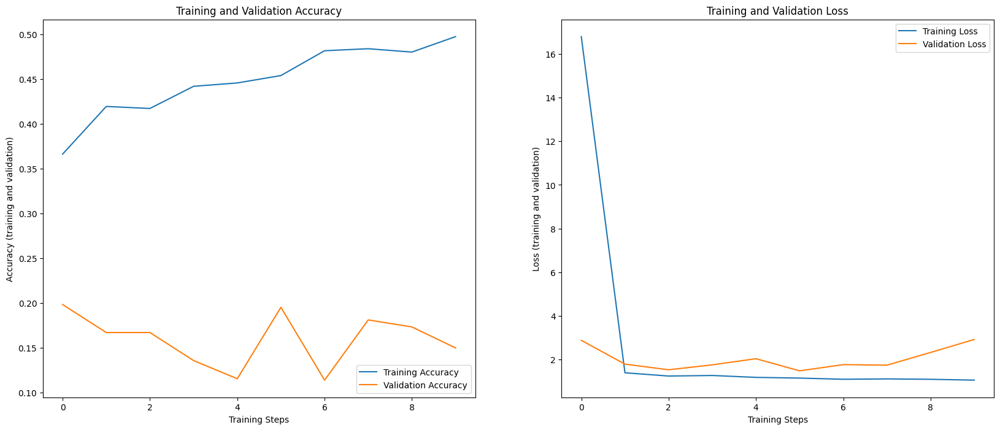

In [ ]:
import matplotlib.pylab as plt
import numpy as np

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.ylabel("Accuracy (training and validation)")
plt.xlabel("Training Steps")

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.ylabel("Loss (training and validation)")
plt.xlabel("Training Steps")
plt.show()

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
model = tf.keras.Sequential([
hub.KerasLayer("https://tfhub.dev/tensorflow/efficientnet/b7/feature-vector/1"),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(512, activation='relu'),

  tf.keras.layers.Dense(train_generator.num_classes, activation='softmax')
])

model.build([None, 244, 244, 3])

In [ ]:
LEARNING_RATE = 0.0001

model.compile(
   optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE),
   loss='categorical_crossentropy',
   metrics=['accuracy'])

In [ ]:
EPOCHS = 3

history = model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples//train_generator.batch_size,
        epochs=EPOCHS,
        validation_data=validation_generator,
        #callbacks = [callbacks],
        validation_steps=validation_generator.samples//validation_generator.batch_size)

# Custom Model 1 (Best Model trained for this dataset)

In [ ]:
import tensorflow as tf

def conv_block(x, growth_rate):
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)
    # 1x1 convolution

    x = tf.keras.layers.Conv2D(filters=4 * growth_rate, kernel_size=1, padding='same')(x)
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)
    # 3x3 convolution
    x = tf.keras.layers.Conv2D(filters=growth_rate, kernel_size=3, padding='same')(x)
    return x

def dense_block(x, num_layers, growth_rate):
    for i in range(num_layers):
        # Call conv_block function to add a dense block layer
        layer = conv_block(x, growth_rate)
        # Concatenate the output of the conv_block function to the input x
        x = tf.keras.layers.Concatenate()([x, layer])
    return x

def transition_block(x, compression_factor):
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)
    # 1x1 convolution
    num_filters = int(x.shape[-1] * compression_factor)
    x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=1, padding='same')(x)
    # 2x2 average pooling
    x = tf.keras.layers.AveragePooling2D(pool_size=2, strides=2)(x)
    return x

def DenseNet121(input_shape=(224,224,3), num_classes=1000, compression_factor=0.5, growth_rate=32, num_dense_blocks=[6,12,24,16]):
    # Define the input tensor shape
    inputs = tf.keras.layers.Input(shape=input_shape)

    # Initial convolution layer
    x = tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=2, padding='same')(inputs)
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)
    # 2x2 max pooling
    x = tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same')(x)

    # Dense blocks
    for i, num_layers in enumerate(num_dense_blocks):
        # Add a dense block
        x = dense_block(x, num_layers=num_layers, growth_rate=growth_rate)
        # If not the last dense block, add a transition block
        if i != len(num_dense_blocks) - 1:
            x = transition_block(x, compression_factor=compression_factor)

    # Final dense block
    x = dense_block(x, num_layers=num_dense_blocks[-1], growth_rate=growth_rate)
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)

    # Global average pooling
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # Fully connected layer
    outputs = tf.keras.layers.Dense(units=num_classes, activation='softmax')(x)

    # Create the model
    model = tf.keras.models.Model(inputs=inputs, outputs=outputs)

    return model

# Test the function
model = DenseNet121()

inputs = model.input
x = tf.keras.layers.Flatten()(pretrained_model.output)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(4, activation='softmax')(x)
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.summary()


In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
his=model.fit(train_datagen.flow(trainx,trainy,batch_size=32),validation_data=(testx,testy),epochs=30, verbose=1)

Epoch 1/30
22/22 [==============================] - 112s 956ms/step - loss: 2.0690 - accuracy: 0.3319 - val_loss: 3.0035 - val_accuracy: 0.0888
Epoch 2/30
22/22 [==============================] - 11s 502ms/step - loss: 1.7059 - accuracy: 0.4474 - val_loss: 3.2311 - val_accuracy: 0.1361
Epoch 3/30
22/22 [==============================] - 11s 498ms/step - loss: 1.5522 - accuracy: 0.4919 - val_loss: 3.3255 - val_accuracy: 0.1420
Epoch 4/30
22/22 [==============================] - 11s 479ms/step - loss: 1.4348 - accuracy: 0.5348 - val_loss: 2.5212 - val_accuracy: 0.1893
Epoch 5/30
22/22 [==============================] - 11s 490ms/step - loss: 1.2547 - accuracy: 0.5704 - val_loss: 1.8899 - val_accuracy: 0.3018
Epoch 6/30
22/22 [==============================] - 11s 508ms/step - loss: 1.1351 - accuracy: 0.6074 - val_loss: 1.8930 - val_accuracy: 0.3609
Epoch 7/30
22/22 [==============================] - 11s 503ms/step - loss: 1.1081 - accuracy: 0.6074 - val_loss: 1.3849 - val_accuracy: 0.479

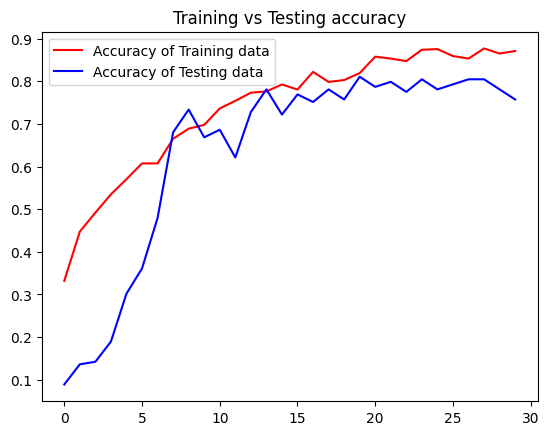

<Figure size 640x480 with 0 Axes>

In [ ]:
get_acc = his.history['accuracy']
value_acc = his.history['val_accuracy']
get_loss = his.history['loss']
validation_loss = his.history['val_loss']

epochs = range(len(get_acc))
plt.plot(epochs, get_acc, 'r', label='Accuracy of Training data')
plt.plot(epochs, value_acc, 'b', label='Accuracy of Testing data')
plt.title('Training vs Testing accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

In [ ]:
model.evaluate(testx,testy)

6/6 [==============================] - 1s 98ms/step - loss: 0.7827 - accuracy: 0.7574


[0.7827176451683044, 0.7573964595794678]

# Custom Model2 DenseNet

In [ ]:
import tensorflow as tf

def conv_block(x, growth_rate):
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)
    # 1x1 convolution

    x = tf.keras.layers.Conv2D(filters=4 * growth_rate, kernel_size=1, padding='same')(x)
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)
    # 3x3 convolution
    x = tf.keras.layers.Conv2D(filters=growth_rate, kernel_size=3, padding='same')(x)
    return x

def dense_block(x, num_layers, growth_rate):
    for i in range(num_layers):
        # Call conv_block function to add a dense block layer
        layer = conv_block(x, growth_rate)
        # Concatenate the output of the conv_block function to the input x
        x = tf.keras.layers.Concatenate()([x, layer])
    return x

def transition_block(x, compression_factor):
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)
    # 1x1 convolution
    num_filters = int(x.shape[-1] * compression_factor)
    x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=1, padding='same')(x)
    # 2x2 average pooling
    x = tf.keras.layers.AveragePooling2D(pool_size=2, strides=2)(x)
    return x

def DenseNet121(input_shape=(224,224,3), num_classes=1000, compression_factor=0.5, growth_rate=32, num_dense_blocks=[6,12,24,16]):
    # Define the input tensor shape
    inputs = tf.keras.layers.Input(shape=input_shape)

    # Initial convolution layer
    x = tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=2, padding='same')(inputs)
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)
    # 2x2 max pooling
    x = tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same')(x)

    # Dense blocks
    for i, num_layers in enumerate(num_dense_blocks):
        # Add a dense block
        x = dense_block(x, num_layers=num_layers, growth_rate=growth_rate)
        # If not the last dense block, add a transition block
        if i != len(num_dense_blocks) - 1:
            x = transition_block(x, compression_factor=compression_factor)

    # Final dense block
    x = dense_block(x, num_layers=num_dense_blocks[-1], growth_rate=growth_rate)
    # Batch normalization
    x = tf.keras.layers.BatchNormalization()(x)
    # ReLU activation
    x = tf.keras.layers.Activation('relu')(x)

    # Global average pooling
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # Fully connected layer
    outputs = tf.keras.layers.Dense(units=num_classes, activation='softmax')(x)

    # Create the model
    model = tf.keras.models.Model(inputs=inputs, outputs=outputs)

    return model

# Test the function
model = DenseNet121()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 112, 112, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 112, 112, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
inputs = model.input
x = tf.keras.layers.Flatten()(model.output)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(4, activation='softmax')(x)
cus_model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
cus_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
his2=cus_model.fit(train_datagen.flow(trainx,trainy,batch_size=32),validation_data=(testx,testy),epochs=30, verbose=1)

Epoch 1/30
22/22 [==============================] - 137s 732ms/step - loss: 1.3110 - accuracy: 0.4652 - val_loss: 1.3437 - val_accuracy: 0.7041
Epoch 2/30
22/22 [==============================] - 12s 540ms/step - loss: 1.1987 - accuracy: 0.5719 - val_loss: 1.3023 - val_accuracy: 0.7041
Epoch 3/30
22/22 [==============================] - 12s 530ms/step - loss: 1.1739 - accuracy: 0.5778 - val_loss: 1.2652 - val_accuracy: 0.7041
Epoch 4/30
22/22 [==============================] - 12s 534ms/step - loss: 1.0986 - accuracy: 0.6281 - val_loss: 1.2291 - val_accuracy: 0.7041
Epoch 5/30
22/22 [==============================] - 11s 504ms/step - loss: 0.9901 - accuracy: 0.6696 - val_loss: 1.1903 - val_accuracy: 0.7041
Epoch 6/30
22/22 [==============================] - 11s 470ms/step - loss: 0.9574 - accuracy: 0.7200 - val_loss: 1.1574 - val_accuracy: 0.7041
Epoch 7/30
22/22 [==============================] - 12s 515ms/step - loss: 0.9659 - accuracy: 0.7067 - val_loss: 1.1288 - val_accuracy: 0.704

# Custom CNN

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Define the model architecture
model = Sequential()

model.add(Conv2D(64, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))


model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))



model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(4, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Print the model summary
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_17 (Conv2D)          (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 111, 111, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 54, 54, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 26, 26, 256)     

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
his3=model.fit(train_datagen.flow(trainx,trainy,batch_size=32),validation_data=(testx,testy),epochs=30, verbose=1)

Epoch 1/30
35/35 [==============================] - 111s 535ms/step - loss: 1.2251 - accuracy: 0.4164 - val_loss: 1.1780 - val_accuracy: 0.4464
Epoch 2/30
35/35 [==============================] - 15s 417ms/step - loss: 1.1543 - accuracy: 0.4486 - val_loss: 1.2151 - val_accuracy: 0.3464
Epoch 3/30
35/35 [==============================] - 14s 409ms/step - loss: 1.1277 - accuracy: 0.4441 - val_loss: 1.1180 - val_accuracy: 0.4429
Epoch 4/30
35/35 [==============================] - 15s 421ms/step - loss: 1.0736 - accuracy: 0.4924 - val_loss: 1.0912 - val_accuracy: 0.4964
Epoch 5/30
35/35 [==============================] - 14s 406ms/step - loss: 1.0697 - accuracy: 0.4906 - val_loss: 1.0934 - val_accuracy: 0.4714
Epoch 6/30
35/35 [==============================] - 15s 417ms/step - loss: 1.0441 - accuracy: 0.5094 - val_loss: 1.0978 - val_accuracy: 0.4929
Epoch 7/30
35/35 [==============================] - 14s 405ms/step - loss: 0.9999 - accuracy: 0.5344 - val_loss: 1.1121 - val_accuracy: 0.496

In [ ]:
model.evaluate(testx,testy)

9/9 [==============================] - 0s 45ms/step - loss: 1.0049 - accuracy: 0.5250


[1.004906177520752, 0.5249999761581421]